# **Pre-trained VGG-16 model trained on the KDEF dataset with input image resolution of 56x56.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.6 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_56x56.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_56x56'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_56x56', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


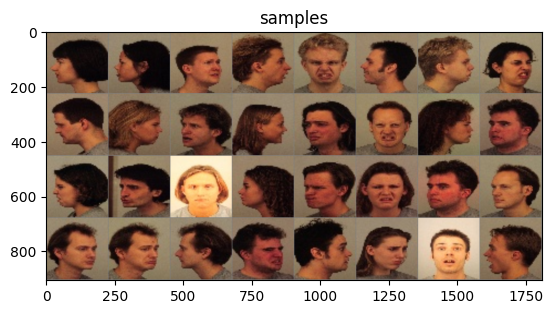

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())


        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)



def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 141MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.21it/s]


train Loss: 1.9264 Acc: 0.1859


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 1.8184 Acc: 0.2592

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.13it/s]


train Loss: 1.4924 Acc: 0.4018


100%|██████████| 16/16 [00:01<00:00, 15.63it/s]


val Loss: 1.2955 Acc: 0.4980

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.07it/s]


train Loss: 0.9984 Acc: 0.6073


100%|██████████| 16/16 [00:01<00:00, 15.78it/s]


val Loss: 0.8893 Acc: 0.6531

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.11it/s]


train Loss: 0.7738 Acc: 0.7041


100%|██████████| 16/16 [00:00<00:00, 16.06it/s]


val Loss: 0.7157 Acc: 0.7327

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.05it/s]


train Loss: 0.6606 Acc: 0.7492


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.6679 Acc: 0.7878

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.13it/s]


train Loss: 0.4386 Acc: 0.8417


100%|██████████| 16/16 [00:00<00:00, 16.11it/s]


val Loss: 0.5109 Acc: 0.8184

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.16it/s]


train Loss: 0.3593 Acc: 0.8658


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.5036 Acc: 0.8265

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.09it/s]


train Loss: 0.3504 Acc: 0.8712


100%|██████████| 16/16 [00:00<00:00, 16.08it/s]


val Loss: 0.4839 Acc: 0.8347

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.08it/s]


train Loss: 0.3249 Acc: 0.8791


100%|██████████| 16/16 [00:00<00:00, 16.06it/s]


val Loss: 0.4804 Acc: 0.8408

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.05it/s]


train Loss: 0.3170 Acc: 0.8868


100%|██████████| 16/16 [00:01<00:00, 15.71it/s]


val Loss: 0.4696 Acc: 0.8408

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.10it/s]


train Loss: 0.2948 Acc: 0.8941


100%|██████████| 16/16 [00:01<00:00, 15.99it/s]


val Loss: 0.4691 Acc: 0.8306

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.11it/s]


train Loss: 0.2622 Acc: 0.9136


100%|██████████| 16/16 [00:00<00:00, 16.02it/s]


val Loss: 0.4496 Acc: 0.8469

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.13it/s]


train Loss: 0.2646 Acc: 0.9066


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.4566 Acc: 0.8408

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.14it/s]


train Loss: 0.2559 Acc: 0.9061


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 0.4543 Acc: 0.8429

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.08it/s]


train Loss: 0.2575 Acc: 0.9098


100%|██████████| 16/16 [00:01<00:00, 15.15it/s]


val Loss: 0.4552 Acc: 0.8408

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.11it/s]


train Loss: 0.2519 Acc: 0.9098


100%|██████████| 16/16 [00:00<00:00, 16.08it/s]


val Loss: 0.4543 Acc: 0.8449

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.12it/s]


train Loss: 0.2484 Acc: 0.9147


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.4562 Acc: 0.8469

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.03it/s]


train Loss: 0.2470 Acc: 0.9181


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.4553 Acc: 0.8449

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.11it/s]


train Loss: 0.2502 Acc: 0.9100


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.4539 Acc: 0.8408

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.07it/s]


train Loss: 0.2440 Acc: 0.9200


100%|██████████| 16/16 [00:00<00:00, 16.22it/s]


val Loss: 0.4539 Acc: 0.8388

Training complete in 5m 25s
Best val Acc: 0.846939
Showing misclassified examples for fold 0...


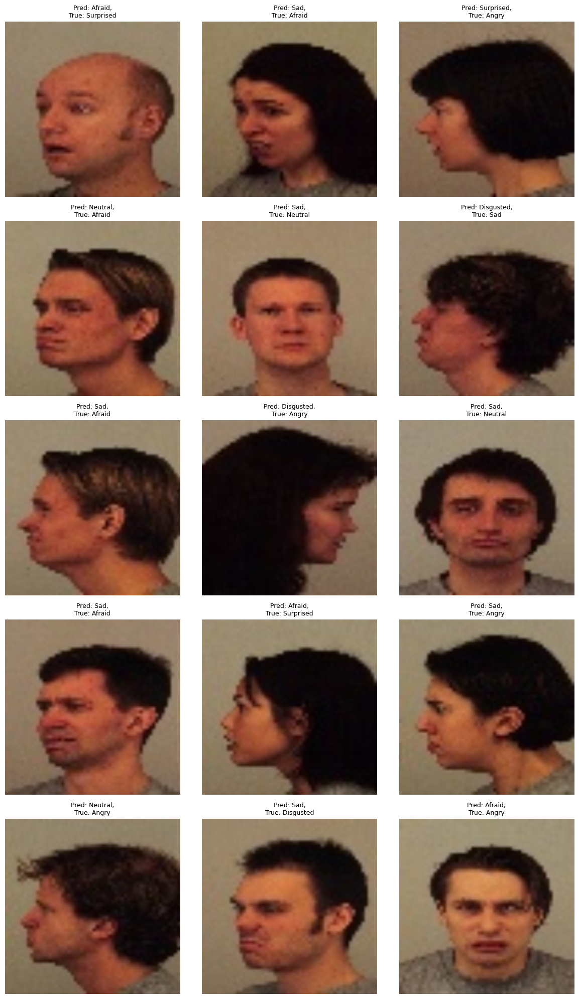




------------------------------------
 Accuracies  [0.8469387755102041]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 1.9242 Acc: 0.1923


100%|██████████| 16/16 [00:01<00:00, 14.95it/s]


val Loss: 1.7674 Acc: 0.3673

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 1.4441 Acc: 0.4410


100%|██████████| 16/16 [00:01<00:00, 15.79it/s]


val Loss: 1.1083 Acc: 0.5490

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.9720 Acc: 0.6240


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.9729 Acc: 0.6429

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.7803 Acc: 0.7048


100%|██████████| 16/16 [00:01<00:00, 15.80it/s]


val Loss: 0.7068 Acc: 0.7367

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 0.6220 Acc: 0.7649


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.6536 Acc: 0.7571

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.4132 Acc: 0.8549


100%|██████████| 16/16 [00:01<00:00, 15.65it/s]


val Loss: 0.5485 Acc: 0.8082

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.3562 Acc: 0.8705


100%|██████████| 16/16 [00:01<00:00, 15.72it/s]


val Loss: 0.5392 Acc: 0.8020

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 0.3261 Acc: 0.8819


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.5163 Acc: 0.8306

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.3189 Acc: 0.8871


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.5261 Acc: 0.8143

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2955 Acc: 0.8952


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 0.5060 Acc: 0.8306

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2827 Acc: 0.8975


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.5071 Acc: 0.8306

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2452 Acc: 0.9159


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.4883 Acc: 0.8408

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2342 Acc: 0.9249


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.4868 Acc: 0.8408

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2416 Acc: 0.9172


100%|██████████| 16/16 [00:01<00:00, 15.31it/s]


val Loss: 0.4869 Acc: 0.8408

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.2395 Acc: 0.9190


100%|██████████| 16/16 [00:01<00:00, 15.72it/s]


val Loss: 0.4884 Acc: 0.8408

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 0.2372 Acc: 0.9170


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.4831 Acc: 0.8429

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.2273 Acc: 0.9220


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 0.4836 Acc: 0.8367

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.2289 Acc: 0.9247


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.4838 Acc: 0.8388

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 0.2299 Acc: 0.9213


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.4837 Acc: 0.8367

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.2248 Acc: 0.9227


100%|██████████| 16/16 [00:01<00:00, 14.63it/s]


val Loss: 0.4841 Acc: 0.8408

Training complete in 5m 30s
Best val Acc: 0.842857
Showing misclassified examples for fold 1...


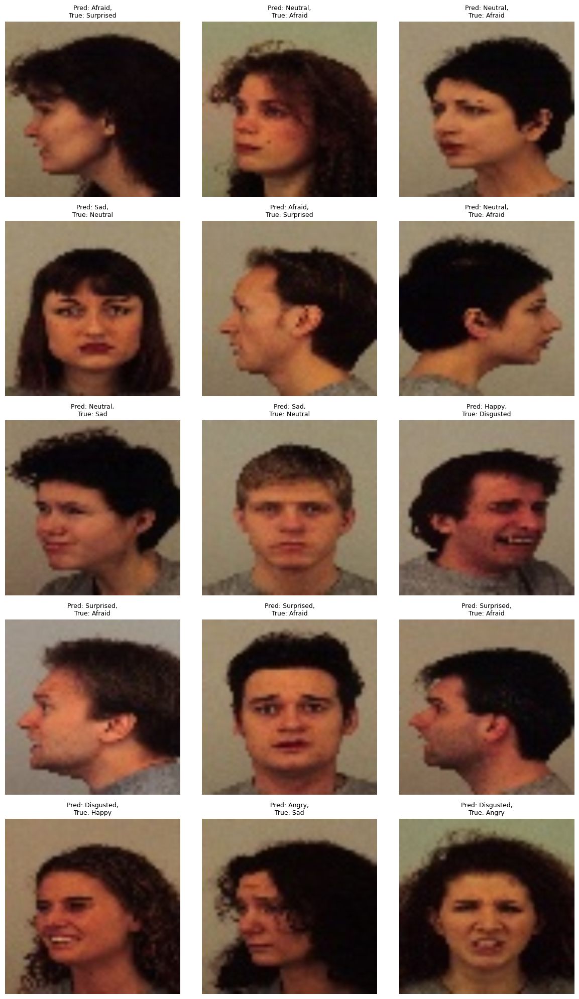




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.76it/s]


train Loss: 1.9286 Acc: 0.1766


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 1.8192 Acc: 0.3000

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 1.5578 Acc: 0.3737


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 1.2055 Acc: 0.5245

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 1.0475 Acc: 0.5889


100%|██████████| 16/16 [00:01<00:00, 15.80it/s]


val Loss: 0.8838 Acc: 0.6755

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.8053 Acc: 0.6939


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 0.8297 Acc: 0.6980

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.66it/s]


train Loss: 0.6666 Acc: 0.7492


100%|██████████| 16/16 [00:01<00:00, 14.94it/s]


val Loss: 0.7173 Acc: 0.7327

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.80it/s]


train Loss: 0.4532 Acc: 0.8363


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.5280 Acc: 0.8082

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.3863 Acc: 0.8567


100%|██████████| 16/16 [00:01<00:00, 14.00it/s]


val Loss: 0.5201 Acc: 0.8041

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.3517 Acc: 0.8739


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.5327 Acc: 0.8122

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.3395 Acc: 0.8771


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.5056 Acc: 0.8245

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.3189 Acc: 0.8862


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 0.4922 Acc: 0.8184

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.3050 Acc: 0.8882


100%|██████████| 16/16 [00:01<00:00, 15.00it/s]


val Loss: 0.4694 Acc: 0.8367

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.2740 Acc: 0.8986


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.4760 Acc: 0.8286

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.77it/s]


train Loss: 0.2743 Acc: 0.9016


100%|██████████| 16/16 [00:01<00:00, 15.22it/s]


val Loss: 0.4721 Acc: 0.8347

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2685 Acc: 0.9000


100%|██████████| 16/16 [00:01<00:00, 15.78it/s]


val Loss: 0.4767 Acc: 0.8327

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.2539 Acc: 0.9093


100%|██████████| 16/16 [00:01<00:00, 15.87it/s]


val Loss: 0.4751 Acc: 0.8286

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.2649 Acc: 0.9007


100%|██████████| 16/16 [00:01<00:00, 14.78it/s]


val Loss: 0.4763 Acc: 0.8327

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.2529 Acc: 0.9068


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 0.4806 Acc: 0.8286

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.2580 Acc: 0.9036


100%|██████████| 16/16 [00:01<00:00, 14.39it/s]


val Loss: 0.4797 Acc: 0.8306

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.2500 Acc: 0.9184


100%|██████████| 16/16 [00:01<00:00, 15.98it/s]


val Loss: 0.4791 Acc: 0.8306

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2542 Acc: 0.9116


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.4788 Acc: 0.8306

Training complete in 5m 34s
Best val Acc: 0.836735
Showing misclassified examples for fold 2...


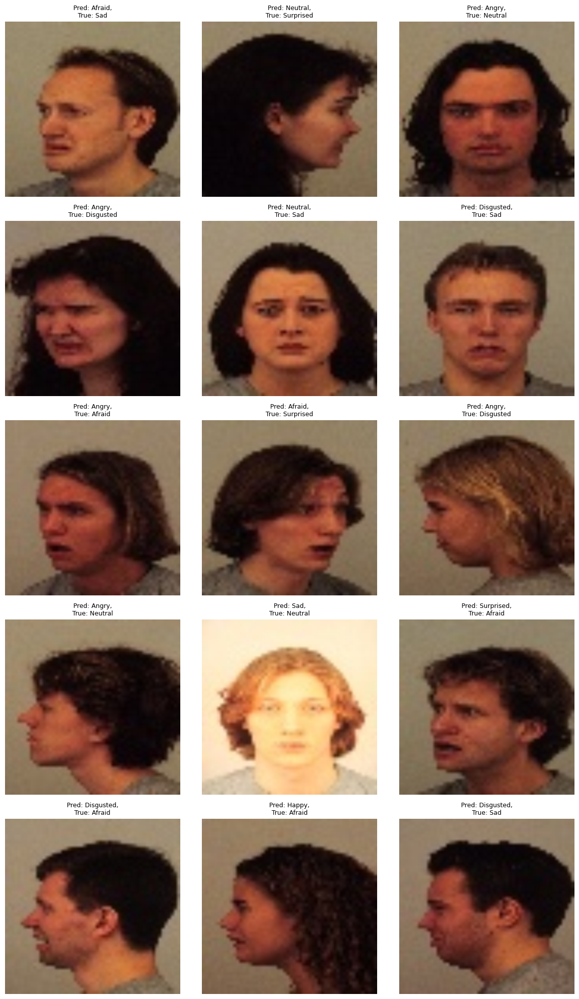




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.76it/s]


train Loss: 1.9071 Acc: 0.2043


100%|██████████| 16/16 [00:01<00:00, 14.77it/s]


val Loss: 1.7758 Acc: 0.2980

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 1.4069 Acc: 0.4433


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 1.1786 Acc: 0.5673

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.9878 Acc: 0.6218


100%|██████████| 16/16 [00:01<00:00, 15.37it/s]


val Loss: 0.7862 Acc: 0.6531

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.72it/s]


train Loss: 0.7520 Acc: 0.7224


100%|██████████| 16/16 [00:01<00:00, 14.89it/s]


val Loss: 0.7738 Acc: 0.7082

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.75it/s]


train Loss: 0.6471 Acc: 0.7571


100%|██████████| 16/16 [00:01<00:00, 15.56it/s]


val Loss: 0.5712 Acc: 0.7939

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.4024 Acc: 0.8533


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4882 Acc: 0.8082

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.3541 Acc: 0.8769


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.4609 Acc: 0.8143

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.3368 Acc: 0.8787


100%|██████████| 16/16 [00:01<00:00, 14.66it/s]


val Loss: 0.4529 Acc: 0.8245

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.76it/s]


train Loss: 0.3128 Acc: 0.8937


100%|██████████| 16/16 [00:01<00:00, 15.50it/s]


val Loss: 0.4548 Acc: 0.8347

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.78it/s]


train Loss: 0.2913 Acc: 0.8973


100%|██████████| 16/16 [00:01<00:00, 15.33it/s]


val Loss: 0.4485 Acc: 0.8204

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.2618 Acc: 0.9063


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.4359 Acc: 0.8265

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.2557 Acc: 0.9109


100%|██████████| 16/16 [00:01<00:00, 15.13it/s]


val Loss: 0.4268 Acc: 0.8327

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2405 Acc: 0.9163


100%|██████████| 16/16 [00:01<00:00, 15.30it/s]


val Loss: 0.4204 Acc: 0.8306

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.2480 Acc: 0.9125


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.4217 Acc: 0.8347

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.2372 Acc: 0.9222


100%|██████████| 16/16 [00:01<00:00, 14.73it/s]


val Loss: 0.4206 Acc: 0.8286

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.68it/s]


train Loss: 0.2339 Acc: 0.9156


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.4232 Acc: 0.8286

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.98it/s]


train Loss: 0.2338 Acc: 0.9179


100%|██████████| 16/16 [00:01<00:00, 14.91it/s]


val Loss: 0.4282 Acc: 0.8286

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2311 Acc: 0.9168


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4261 Acc: 0.8286

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.71it/s]


train Loss: 0.2338 Acc: 0.9209


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.4259 Acc: 0.8286

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.2307 Acc: 0.9211


100%|██████████| 16/16 [00:01<00:00, 14.98it/s]


val Loss: 0.4241 Acc: 0.8286

Training complete in 5m 34s
Best val Acc: 0.834694
Showing misclassified examples for fold 3...


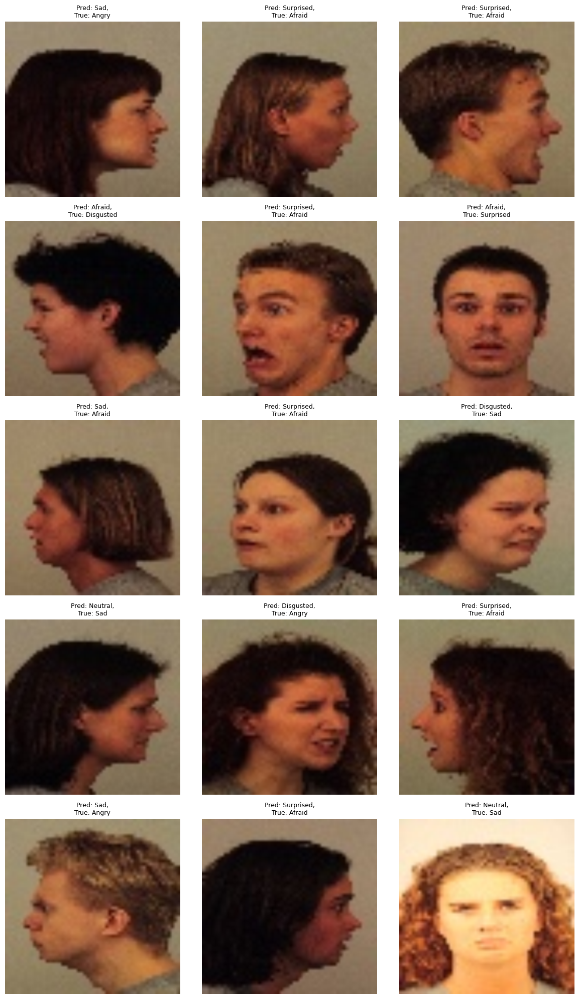




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 1.9309 Acc: 0.1862


100%|██████████| 16/16 [00:01<00:00, 14.28it/s]


val Loss: 1.8206 Acc: 0.2714

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 1.5168 Acc: 0.4102


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 1.1906 Acc: 0.5265

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.79it/s]


train Loss: 1.0315 Acc: 0.6050


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 0.9604 Acc: 0.6327

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.8329 Acc: 0.6732


100%|██████████| 16/16 [00:01<00:00, 15.79it/s]


val Loss: 0.7022 Acc: 0.7347

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.6455 Acc: 0.7515


100%|██████████| 16/16 [00:01<00:00, 14.73it/s]


val Loss: 0.9124 Acc: 0.6551

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.4860 Acc: 0.8211


100%|██████████| 16/16 [00:01<00:00, 15.48it/s]


val Loss: 0.5242 Acc: 0.7857

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.80it/s]


train Loss: 0.3962 Acc: 0.8612


100%|██████████| 16/16 [00:01<00:00, 15.25it/s]


val Loss: 0.4869 Acc: 0.7959

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.99it/s]


train Loss: 0.3707 Acc: 0.8683


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 0.5119 Acc: 0.7980

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.00it/s]


train Loss: 0.3424 Acc: 0.8773


100%|██████████| 16/16 [00:01<00:00, 14.66it/s]


val Loss: 0.4467 Acc: 0.8082

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.3305 Acc: 0.8785


100%|██████████| 16/16 [00:01<00:00, 15.37it/s]


val Loss: 0.4590 Acc: 0.8143

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.3085 Acc: 0.8839


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.4450 Acc: 0.8122

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.2781 Acc: 0.9043


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4291 Acc: 0.8224

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.98it/s]


train Loss: 0.2718 Acc: 0.9025


100%|██████████| 16/16 [00:01<00:00, 14.38it/s]


val Loss: 0.4301 Acc: 0.8163

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2772 Acc: 0.9034


100%|██████████| 16/16 [00:01<00:00, 14.29it/s]


val Loss: 0.4289 Acc: 0.8245

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.2696 Acc: 0.9032


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.4266 Acc: 0.8265

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.2667 Acc: 0.9095


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.4286 Acc: 0.8245

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2659 Acc: 0.9109


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4264 Acc: 0.8245

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.2598 Acc: 0.9104


100%|██████████| 16/16 [00:01<00:00, 15.50it/s]


val Loss: 0.4231 Acc: 0.8204

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.78it/s]


train Loss: 0.2565 Acc: 0.9122


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 0.4220 Acc: 0.8245

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2519 Acc: 0.9122


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 0.4218 Acc: 0.8245

Training complete in 5m 32s
Best val Acc: 0.826531
Showing misclassified examples for fold 4...


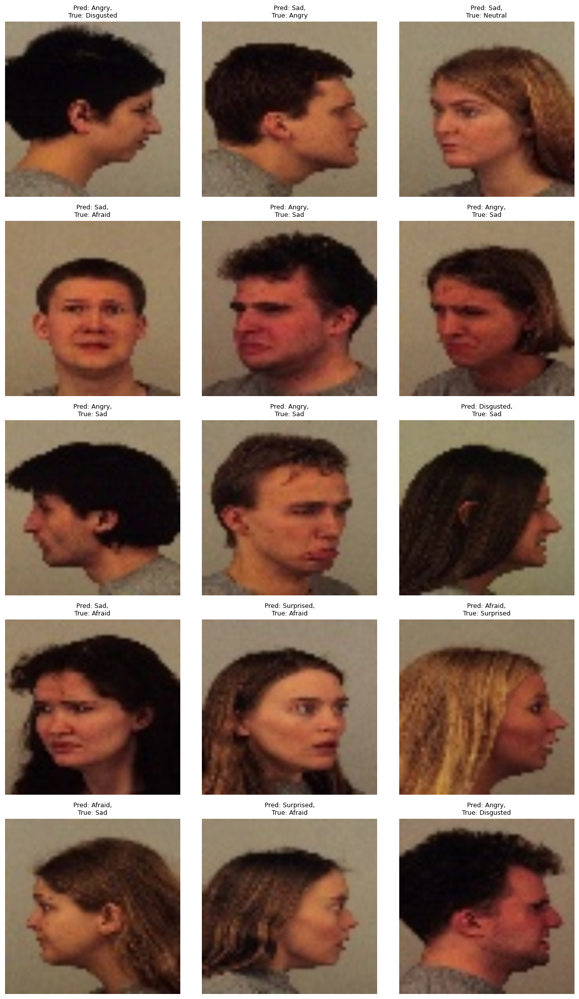




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.71it/s]


train Loss: 1.9254 Acc: 0.1855


100%|██████████| 16/16 [00:01<00:00, 14.71it/s]


val Loss: 1.8487 Acc: 0.2612

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 1.5649 Acc: 0.3891


100%|██████████| 16/16 [00:01<00:00, 14.72it/s]


val Loss: 1.2263 Acc: 0.4776

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 1.0385 Acc: 0.6005


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.9602 Acc: 0.6408

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.8146 Acc: 0.6873


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 0.7544 Acc: 0.7245

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.6546 Acc: 0.7544


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.6344 Acc: 0.7490

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.4313 Acc: 0.8454


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.5218 Acc: 0.7918

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.3823 Acc: 0.8639


100%|██████████| 16/16 [00:01<00:00, 13.91it/s]


val Loss: 0.5187 Acc: 0.7857

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.3571 Acc: 0.8673


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.5235 Acc: 0.7939

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.3393 Acc: 0.8814


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.4947 Acc: 0.8224

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.3181 Acc: 0.8878


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.4714 Acc: 0.8204

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2943 Acc: 0.8925


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 0.5049 Acc: 0.8204

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.2673 Acc: 0.9075


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.4676 Acc: 0.8245

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.78it/s]


train Loss: 0.2660 Acc: 0.9043


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 0.4627 Acc: 0.8245

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.2536 Acc: 0.9118


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.4660 Acc: 0.8245

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.2637 Acc: 0.9088


100%|██████████| 16/16 [00:01<00:00, 15.18it/s]


val Loss: 0.4577 Acc: 0.8245

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.2632 Acc: 0.9093


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4593 Acc: 0.8327

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.2553 Acc: 0.9127


100%|██████████| 16/16 [00:01<00:00, 14.56it/s]


val Loss: 0.4545 Acc: 0.8286

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.2450 Acc: 0.9138


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 0.4548 Acc: 0.8265

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.2535 Acc: 0.9127


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.4546 Acc: 0.8224

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.2572 Acc: 0.9100


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.4547 Acc: 0.8265

Training complete in 5m 32s
Best val Acc: 0.832653
Showing misclassified examples for fold 5...


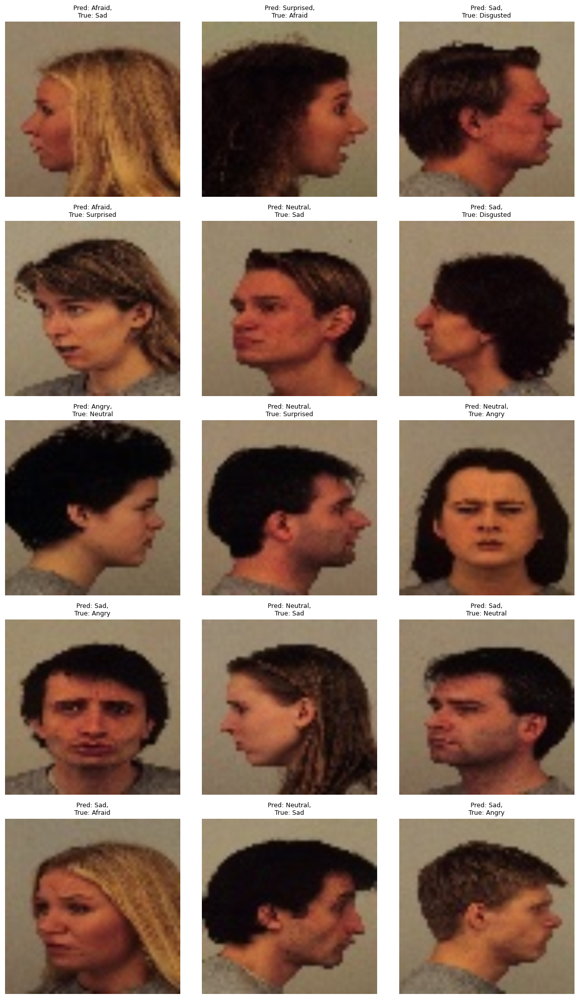




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898, 0.8326530612244899]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 1.9218 Acc: 0.2041


100%|██████████| 16/16 [00:01<00:00, 15.75it/s]


val Loss: 1.8004 Acc: 0.2918

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 1.4886 Acc: 0.4091


100%|██████████| 16/16 [00:01<00:00, 15.38it/s]


val Loss: 1.0890 Acc: 0.5837

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.9858 Acc: 0.6227


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.9044 Acc: 0.6367

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.7931 Acc: 0.6980


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.7931 Acc: 0.7000

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.6145 Acc: 0.7664


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.7022 Acc: 0.7286

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.4156 Acc: 0.8469


100%|██████████| 16/16 [00:01<00:00, 14.23it/s]


val Loss: 0.5423 Acc: 0.7918

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.3618 Acc: 0.8658


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.5443 Acc: 0.7980

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.3394 Acc: 0.8785


100%|██████████| 16/16 [00:01<00:00, 14.86it/s]


val Loss: 0.5139 Acc: 0.8143

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.3199 Acc: 0.8791


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.5014 Acc: 0.8102

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.3006 Acc: 0.8889


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.4786 Acc: 0.8245

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2846 Acc: 0.8998


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 0.4789 Acc: 0.8286

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.2541 Acc: 0.9068


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 0.4699 Acc: 0.8306

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.2477 Acc: 0.9202


100%|██████████| 16/16 [00:01<00:00, 14.29it/s]


val Loss: 0.4710 Acc: 0.8306

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.2451 Acc: 0.9118


100%|██████████| 16/16 [00:01<00:00, 15.71it/s]


val Loss: 0.4701 Acc: 0.8327

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2442 Acc: 0.9179


100%|██████████| 16/16 [00:01<00:00, 15.15it/s]


val Loss: 0.4696 Acc: 0.8286

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.2444 Acc: 0.9190


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.4747 Acc: 0.8347

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.99it/s]


train Loss: 0.2445 Acc: 0.9113


100%|██████████| 16/16 [00:01<00:00, 15.15it/s]


val Loss: 0.4731 Acc: 0.8347

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.2419 Acc: 0.9147


100%|██████████| 16/16 [00:01<00:00, 14.92it/s]


val Loss: 0.4699 Acc: 0.8347

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.2432 Acc: 0.9147


100%|██████████| 16/16 [00:01<00:00, 15.18it/s]


val Loss: 0.4685 Acc: 0.8327

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2398 Acc: 0.9134


100%|██████████| 16/16 [00:01<00:00, 15.12it/s]


val Loss: 0.4674 Acc: 0.8347

Training complete in 5m 30s
Best val Acc: 0.834694
Showing misclassified examples for fold 6...


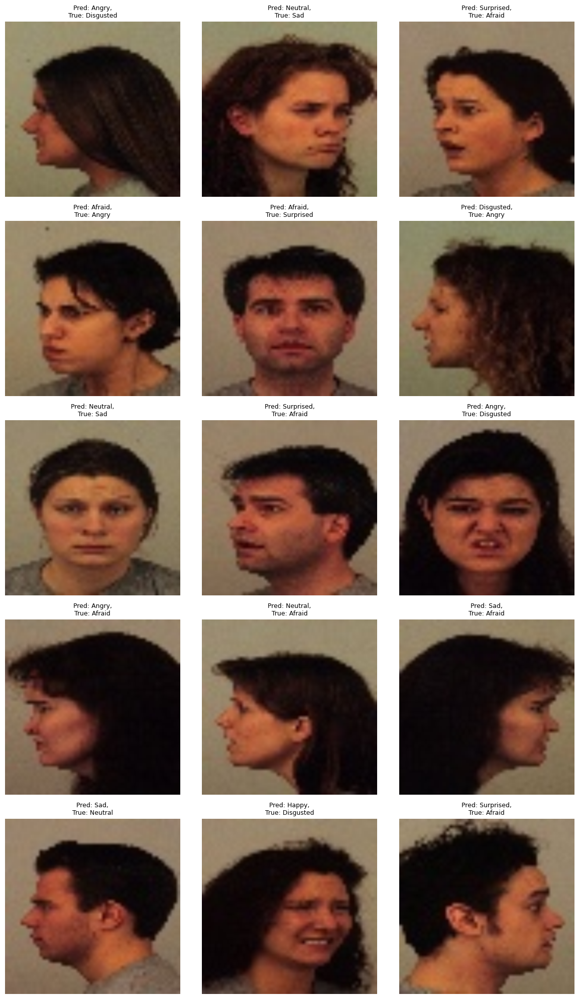




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898, 0.8326530612244899, 0.8346938775510205]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 1.9416 Acc: 0.1766


100%|██████████| 16/16 [00:01<00:00, 15.14it/s]


val Loss: 1.8580 Acc: 0.2510

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 1.6695 Acc: 0.3299


100%|██████████| 16/16 [00:01<00:00, 14.87it/s]


val Loss: 1.2601 Acc: 0.4878

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 1.0891 Acc: 0.5848


100%|██████████| 16/16 [00:01<00:00, 14.51it/s]


val Loss: 0.9231 Acc: 0.6327

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.8280 Acc: 0.6848


100%|██████████| 16/16 [00:01<00:00, 15.55it/s]


val Loss: 0.6946 Acc: 0.7388

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.6798 Acc: 0.7465


100%|██████████| 16/16 [00:01<00:00, 14.75it/s]


val Loss: 0.7196 Acc: 0.7184

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.80it/s]


train Loss: 0.4532 Acc: 0.8358


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.5093 Acc: 0.7980

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.3914 Acc: 0.8619


100%|██████████| 16/16 [00:01<00:00, 15.77it/s]


val Loss: 0.4960 Acc: 0.8061

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.3683 Acc: 0.8698


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.4723 Acc: 0.8082

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.80it/s]


train Loss: 0.3435 Acc: 0.8766


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 0.4551 Acc: 0.8224

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.3229 Acc: 0.8878


100%|██████████| 16/16 [00:01<00:00, 15.50it/s]


val Loss: 0.4608 Acc: 0.8265

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.3021 Acc: 0.8952


100%|██████████| 16/16 [00:01<00:00, 15.33it/s]


val Loss: 0.4535 Acc: 0.8224

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.2785 Acc: 0.9043


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.4475 Acc: 0.8347

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2757 Acc: 0.9057


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 0.4503 Acc: 0.8347

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.93it/s]


train Loss: 0.2735 Acc: 0.9039


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.4635 Acc: 0.8265

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.2713 Acc: 0.9120


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.4531 Acc: 0.8367

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2646 Acc: 0.9077


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.4578 Acc: 0.8306

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.2584 Acc: 0.9136


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.4632 Acc: 0.8286

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2559 Acc: 0.9136


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.4592 Acc: 0.8327

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.2626 Acc: 0.9093


100%|██████████| 16/16 [00:01<00:00, 14.89it/s]


val Loss: 0.4564 Acc: 0.8388

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.2604 Acc: 0.9066


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 0.4551 Acc: 0.8388

Training complete in 5m 31s
Best val Acc: 0.838776
Showing misclassified examples for fold 7...


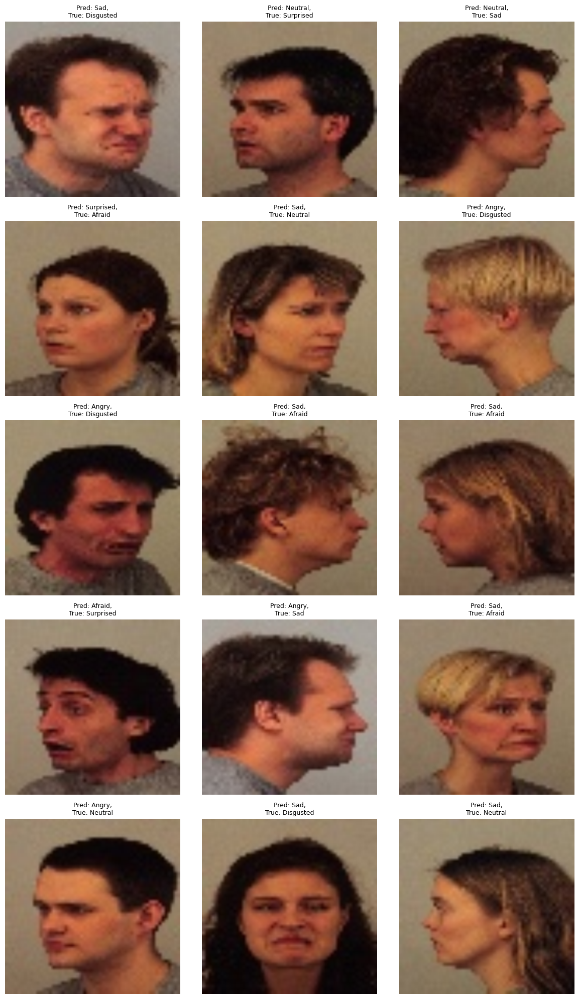




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898, 0.8326530612244899, 0.8346938775510205, 0.8387755102040817]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 1.9151 Acc: 0.1882


100%|██████████| 16/16 [00:01<00:00, 15.71it/s]


val Loss: 1.7980 Acc: 0.2918

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 1.4538 Acc: 0.4293


100%|██████████| 16/16 [00:01<00:00, 13.85it/s]


val Loss: 1.2095 Acc: 0.4980

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.9767 Acc: 0.6240


100%|██████████| 16/16 [00:01<00:00, 14.29it/s]


val Loss: 0.9755 Acc: 0.6163

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.7728 Acc: 0.7061


100%|██████████| 16/16 [00:01<00:00, 14.27it/s]


val Loss: 0.7880 Acc: 0.6918

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.6599 Acc: 0.7596


100%|██████████| 16/16 [00:01<00:00, 15.79it/s]


val Loss: 0.8024 Acc: 0.6837

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.4477 Acc: 0.8404


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.5728 Acc: 0.7796

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.99it/s]


train Loss: 0.3744 Acc: 0.8637


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.5763 Acc: 0.7959

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.3511 Acc: 0.8721


100%|██████████| 16/16 [00:01<00:00, 14.94it/s]


val Loss: 0.5797 Acc: 0.7918

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.3236 Acc: 0.8868


100%|██████████| 16/16 [00:01<00:00, 14.06it/s]


val Loss: 0.5664 Acc: 0.8000

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.3182 Acc: 0.8798


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.5604 Acc: 0.7959

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.84it/s]


train Loss: 0.3007 Acc: 0.8927


100%|██████████| 16/16 [00:01<00:00, 14.96it/s]


val Loss: 0.5359 Acc: 0.8061

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.92it/s]


train Loss: 0.2648 Acc: 0.9093


100%|██████████| 16/16 [00:01<00:00, 15.21it/s]


val Loss: 0.5198 Acc: 0.8143

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.01it/s]


train Loss: 0.2613 Acc: 0.9048


100%|██████████| 16/16 [00:01<00:00, 15.19it/s]


val Loss: 0.5169 Acc: 0.8143

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.90it/s]


train Loss: 0.2545 Acc: 0.9077


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.5205 Acc: 0.8102

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2533 Acc: 0.9116


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.5167 Acc: 0.8143

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2613 Acc: 0.9102


100%|██████████| 16/16 [00:01<00:00, 15.35it/s]


val Loss: 0.5202 Acc: 0.8143

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.01it/s]


train Loss: 0.2615 Acc: 0.9066


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 0.5195 Acc: 0.8143

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.2496 Acc: 0.9109


100%|██████████| 16/16 [00:01<00:00, 14.70it/s]


val Loss: 0.5195 Acc: 0.8102

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 0.2533 Acc: 0.9100


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.5192 Acc: 0.8143

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2523 Acc: 0.9136


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.5198 Acc: 0.8102

Training complete in 5m 31s
Best val Acc: 0.814286
Showing misclassified examples for fold 8...


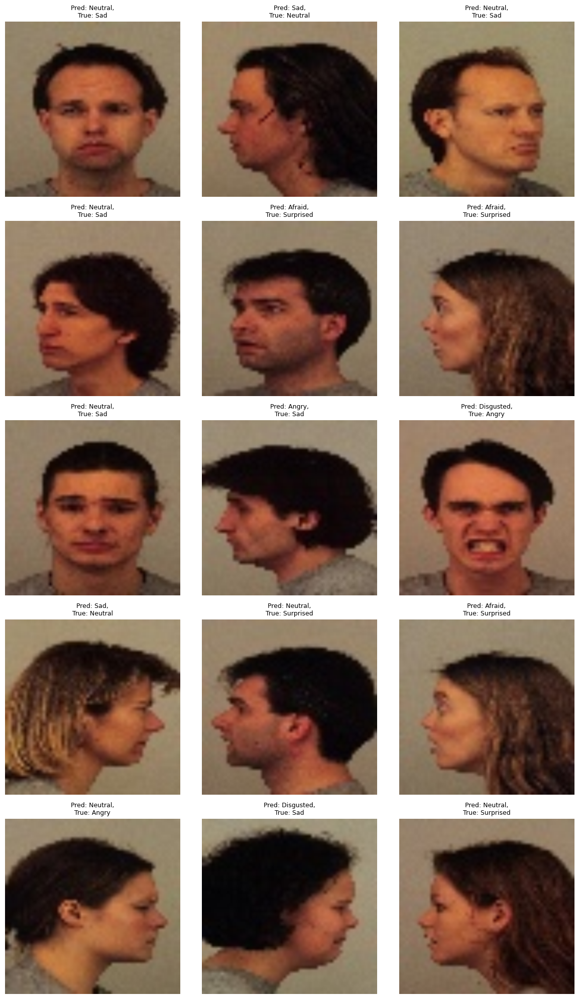




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898, 0.8326530612244899, 0.8346938775510205, 0.8387755102040817, 0.8142857142857144]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.86it/s]


train Loss: 1.9307 Acc: 0.1830


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 1.8563 Acc: 0.2449

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.99it/s]


train Loss: 1.5607 Acc: 0.3766


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 1.2272 Acc: 0.4857

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 1.0559 Acc: 0.5918


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.8146 Acc: 0.6959

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.88it/s]


train Loss: 0.7928 Acc: 0.6921


100%|██████████| 16/16 [00:01<00:00, 14.16it/s]


val Loss: 0.6607 Acc: 0.7449

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.85it/s]


train Loss: 0.6503 Acc: 0.7551


100%|██████████| 16/16 [00:01<00:00, 15.80it/s]


val Loss: 0.5974 Acc: 0.7837

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.98it/s]


train Loss: 0.4087 Acc: 0.8522


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 0.4880 Acc: 0.8367

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.79it/s]


train Loss: 0.3653 Acc: 0.8660


100%|██████████| 16/16 [00:01<00:00, 15.00it/s]


val Loss: 0.4720 Acc: 0.8286

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.91it/s]


train Loss: 0.3294 Acc: 0.8789


100%|██████████| 16/16 [00:01<00:00, 14.60it/s]


val Loss: 0.4536 Acc: 0.8490

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.78it/s]


train Loss: 0.2997 Acc: 0.8909


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.4388 Acc: 0.8388

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.96it/s]


train Loss: 0.2884 Acc: 0.8993


100%|██████████| 16/16 [00:01<00:00, 15.60it/s]


val Loss: 0.4196 Acc: 0.8531

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.89it/s]


train Loss: 0.2680 Acc: 0.9070


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.4327 Acc: 0.8531

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.87it/s]


train Loss: 0.2410 Acc: 0.9138


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.4171 Acc: 0.8571

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.83it/s]


train Loss: 0.2399 Acc: 0.9154


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.4171 Acc: 0.8551

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.97it/s]


train Loss: 0.2367 Acc: 0.9143


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4169 Acc: 0.8612

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.2327 Acc: 0.9168


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.4198 Acc: 0.8612

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2310 Acc: 0.9202


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.4172 Acc: 0.8612

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.95it/s]


train Loss: 0.2370 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 0.4206 Acc: 0.8551

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.94it/s]


train Loss: 0.2265 Acc: 0.9202


100%|██████████| 16/16 [00:01<00:00, 14.69it/s]


val Loss: 0.4203 Acc: 0.8571

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.82it/s]


train Loss: 0.2252 Acc: 0.9179


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.4204 Acc: 0.8571

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.81it/s]


train Loss: 0.2248 Acc: 0.9211


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.4203 Acc: 0.8571

Training complete in 5m 31s
Best val Acc: 0.861224
Showing misclassified examples for fold 9...


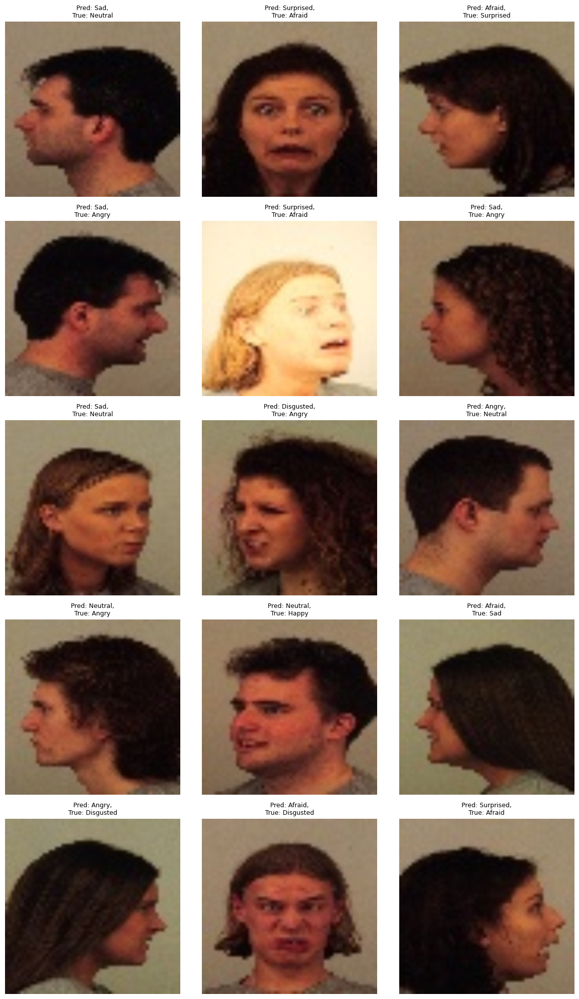




------------------------------------
 Accuracies  [0.8469387755102041, 0.842857142857143, 0.8367346938775511, 0.8346938775510205, 0.826530612244898, 0.8326530612244899, 0.8346938775510205, 0.8387755102040817, 0.8142857142857144, 0.8612244897959185]





'best_model/VGG16_best_model.pt'

In [11]:
import torch
import os
import numpy as np
import shutil
from torch import nn, optim
from torch.optim import lr_scheduler
from torchvision import models
from torch.utils.tensorboard import SummaryWriter

accuracies = []
index = list(np.random.permutation(4900))

best_overall_acc = 0.0
best_model_path = ""

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.vgg16(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.classifier[6].in_features
    model_ft.classifier[6] = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/VGG-16_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)
    writer = SummaryWriter(logdir)

    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    model_path = f'saved/model_fold_{i}.pt'
    torch.save(model_ft.state_dict(), model_path)

    if best_acc > best_overall_acc:
        best_overall_acc = best_acc
        best_model_path = model_path

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
        model=model_ft,
        dataloader=dataloaders['val'],
        class_names={
            0: "Afraid", 1: "Angry", 2: "Disgusted",
            3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
        },
        save_dir=f'misclassified/fold_{i}',
        num_images=15,
    )

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")


os.makedirs('best_model', exist_ok=True)
shutil.copy(best_model_path, 'best_model/VGG16_best_model.pt')



In [12]:
from google.colab import files

!zip -r VGG16_28x28_logs_best_model.zip logs misclassified best_model
files.download('VGG16_28x28_logs_best_model.zip')

  adding: logs/ (stored 0%)
  adding: logs/VGG-16_kfold_0/ (stored 0%)
  adding: logs/VGG-16_kfold_0/events.out.tfevents.1744926794.a42b43edc41a.6444.0 (deflated 61%)
  adding: logs/VGG-16_kfold_8/ (stored 0%)
  adding: logs/VGG-16_kfold_8/events.out.tfevents.1744929486.a42b43edc41a.6444.8 (deflated 61%)
  adding: logs/VGG-16_kfold_4/ (stored 0%)
  adding: logs/VGG-16_kfold_4/events.out.tfevents.1744928139.a42b43edc41a.6444.4 (deflated 61%)
  adding: logs/VGG-16_kfold_7/ (stored 0%)
  adding: logs/VGG-16_kfold_7/events.out.tfevents.1744929149.a42b43edc41a.6444.7 (deflated 61%)
  adding: logs/VGG-16_kfold_3/ (stored 0%)
  adding: logs/VGG-16_kfold_3/events.out.tfevents.1744927799.a42b43edc41a.6444.3 (deflated 61%)
  adding: logs/VGG-16_kfold_6/ (stored 0%)
  adding: logs/VGG-16_kfold_6/events.out.tfevents.1744928813.a42b43edc41a.6444.6 (deflated 61%)
  adding: logs/VGG-16_kfold_5/ (stored 0%)
  adding: logs/VGG-16_kfold_5/events.out.tfevents.1744928476.a42b43edc41a.6444.5 (deflated 61%)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>